Website Traffic Analysis for LA City Infrastructure & Service Requests, this report offers insights into key metrics, including unique visitors, total sessions, and bounce rate, pertaining to lacity.org – the primary online platform serving the City of Los Angeles. The following analysis delves into the interpretation of these metrics and their implications for the city's digital presence and service accessibility.



All the Necessary Imports, Configs, and Data
 Configs
 File location and type

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, to_date, dayofmonth, month, year
from pyspark.sql.functions import date_format, to_timestamp
from pyspark.sql.window import Window
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
from pyspark.sql.functions import col
import seaborn as sns

In [0]:
FILE_LOCATION = "/FileStore/tables/lacity_org_website_traffic.csv";
FILE_TYPE = "csv";
INFER_SCHEMA = "false";
FIRST_ROW_IS_HEADER = "true";
DELIMITER = ",";

In [0]:
# create spark instance SparkSession
spark = SparkSession.builder.appName('dataeng_week10').getOrCreate()

In [0]:
# Read the LA restaurant inspection data
la_tr = spark.read.format(FILE_TYPE) \
  .option("inferSchema", INFER_SCHEMA) \
  .option("header", FIRST_ROW_IS_HEADER) \
  .option("sep", DELIMITER) \
  .load(FILE_LOCATION)

display(la_tr)

Date,Device Category,Browser,# of Visitors,Sessions,Bounce Rate
2014-01-01T00:00:00.000,desktop,Chrome,900,934,55.5675
2014-01-01T00:00:00.000,desktop,Firefox,692,761,40.8673
2014-01-01T00:00:00.000,desktop,Internet Explorer,1038,1107,31.2556
2014-01-01T00:00:00.000,desktop,Opera,35,35,100
2014-01-01T00:00:00.000,desktop,Safari,484,554,24.9097
2014-01-01T00:00:00.000,mobile,Android Browser,242,311,89.0675
2014-01-01T00:00:00.000,mobile,Chrome,242,242,71.4876
2014-01-01T00:00:00.000,mobile,Internet Explorer,35,35,100
2014-01-01T00:00:00.000,mobile,Safari,969,1038,60.0193
2014-01-01T00:00:00.000,mobile,Safari (in-app),35,35,100


In [0]:
# convert date to dates
la_tr = la_tr.withColumn("timestamp", col("Date")).drop("Date")
la_tr = la_tr.withColumn("date", to_date(col("timestamp")))
la_tr = la_tr.withColumn("day", dayofmonth(col("date")))
la_tr = la_tr.withColumn("month", month(col("date")))  
la_tr = la_tr.withColumn("year", year(col("date")))
display(la_tr)

Device Category,Browser,# of Visitors,Sessions,Bounce Rate,timestamp,date,day,month,year
desktop,Chrome,900,934,55.5675,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
desktop,Firefox,692,761,40.8673,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
desktop,Internet Explorer,1038,1107,31.2556,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
desktop,Opera,35,35,100,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
desktop,Safari,484,554,24.9097,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
mobile,Android Browser,242,311,89.0675,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
mobile,Chrome,242,242,71.4876,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
mobile,Internet Explorer,35,35,100,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
mobile,Safari,969,1038,60.0193,2014-01-01T00:00:00.000,2014-01-01,1,1,2014
mobile,Safari (in-app),35,35,100,2014-01-01T00:00:00.000,2014-01-01,1,1,2014


Data Manipulation


In [0]:
# ****** ----------- Rewrite this Data manipulation as SparkSQL ----------***********
# la_tr = la_tr.withColumn("hour", date_format(to_timestamp(col("timestamp")),"H")) \
#              .withColumn("dayofweek", date_format(to_timestamp(col("timestamp")),"E"))

# # A simple Window spec based on the Device category
# windowSpec = Window.partitionBy("Device Category").orderBy("timestamp")

# la_tr = la_tr.withColumn("row_num", F.row_number().over(windowSpec)) \
#    .withColumn("rank", F.rank().over(windowSpec)) \
#    .withColumn("dense_rank", F.dense_rank().over(windowSpec)) \
#    .withColumn("count", F.count("*").over(windowSpec)) \
#    .withColumn("first", F.first("# of Visitors").over(windowSpec)) \
#    .withColumn("last", F.last("# of Visitors").over(windowSpec)) \
#    .withColumn("min", F.min("# of Visitors").over(windowSpec)) \
#    .withColumn("max", F.max("# of Visitors").over(windowSpec)) \
#    .withColumn("nth", F.nth_value("# of Visitors", 2).over(windowSpec)) \
#    .withColumn("lag", F.lag("# of Visitors", 1).over(windowSpec)) \
#    .withColumn("lead", F.lead("# of Visitors", 1).over(windowSpec)) \
#    .withColumn("percent", F.percent_rank().over(windowSpec)) \
#    .withColumn("ntile", F.ntile(2).over(windowSpec)) \
#    .orderBy("Device Category", "timestamp")
# display(la_tr)

la_tr.createOrReplaceTempView("la_tr")

la_tr = spark.sql("""
SELECT *, 
       date_format(to_timestamp(timestamp),"H") AS hour,
       date_format(to_timestamp(timestamp),"E") AS dayofweek,
       row_number() OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS row_num,
       rank() OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS rank,
       dense_rank() OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS dense_rank,
       count(*) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS count,
       first(`# of Visitors`) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS first,
       last(`# of Visitors`) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS last,
       min(`# of Visitors`) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS min,
       max(`# of Visitors`) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS max,
       nth_value(`# of Visitors`, 2) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS nth,
       lag(`# of Visitors`, 1) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS lag,
       lead(`# of Visitors`, 1) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS lead,
       percent_rank() OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS percent,
       ntile(2) OVER (PARTITION BY `Device Category` ORDER BY timestamp) AS ntile
FROM la_tr
ORDER BY `Device Category`, timestamp
""")

display(la_tr)

Device Category,Browser,# of Visitors,Sessions,Bounce Rate,timestamp,date,day,month,year,hour,dayofweek,row_num,rank,dense_rank,count,first,last,min,max,nth,lag,lead,percent,ntile
desktop,Chrome,900,934,55.5675,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,1,1,1,1550,900,437,1000,999,692,null,692,0.0,1
desktop,Firefox,692,761,40.8673,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,2,1,1,1550,900,437,1000,999,692,900,1038,0.0,1
desktop,Internet Explorer,1038,1107,31.2556,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,3,1,1,1550,900,437,1000,999,692,692,35,0.0,1
desktop,Opera,35,35,100,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,4,1,1,1550,900,437,1000,999,692,1038,484,0.0,1
desktop,Safari,484,554,24.9097,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,5,1,1,1550,900,437,1000,999,692,35,900,0.0,1
desktop,Chrome,900,935,55.508,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,6,1,1,1550,900,437,1000,999,692,484,692,0.0,1
desktop,Firefox,692,762,40.9449,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,7,1,1,1550,900,437,1000,999,692,900,1039,0.0,1
desktop,Internet Explorer,1039,1108,31.2274,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,8,1,1,1550,900,437,1000,999,692,692,35,0.0,1
desktop,Opera,35,35,100,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,9,1,1,1550,900,437,1000,999,692,1039,485,0.0,1
desktop,Safari,485,554,24.9097,2014-01-01T00:00:00.000,2014-01-01,1,1,2014,0,Wed,10,1,1,1550,900,437,1000,999,692,35,900,0.0,1


Data Visualization 

In [0]:
# Cast Values
la_tr = la_tr.withColumn("Sessions", la_tr["Sessions"].cast("int"))
la_tr = la_tr.withColumn("# of Visitors", la_tr["# of Visitors"].cast("int"))
la_tr = la_tr.withColumn("Bounce Rate", la_tr["Bounce Rate"].cast("int"))


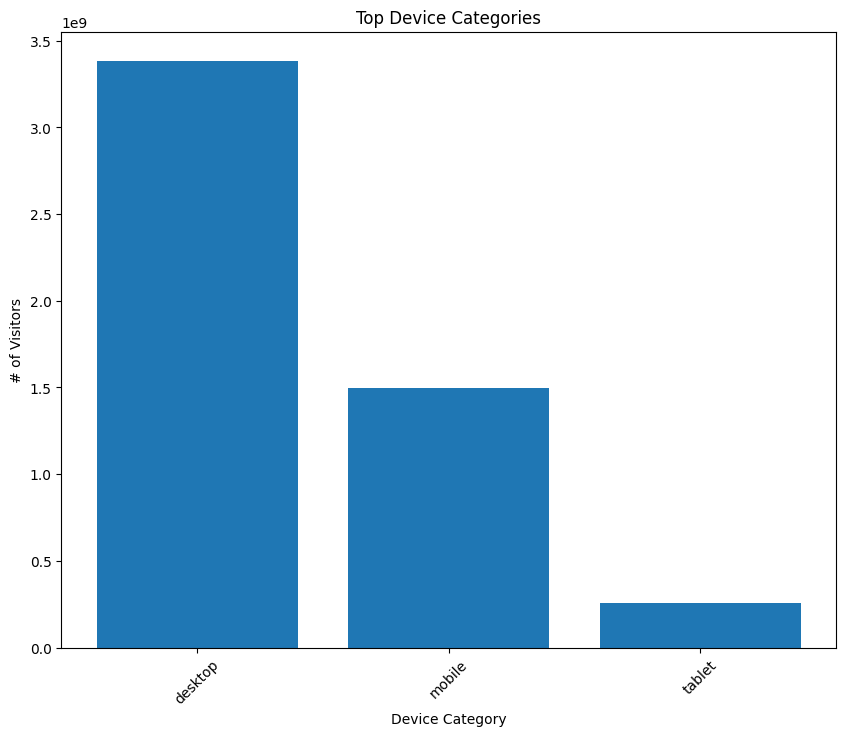

In [0]:
# Top device categoriee

result = spark.sql("""
    SELECT `Device Category`, SUM(`# of Visitors`) AS `sum(# of Visitors)` 
    FROM la_tr
    GROUP BY `Device Category`
    ORDER BY 2 DESC
""").toPandas()

plt.figure(figsize=(10, 8))
plt.bar(result['Device Category'], result['sum(# of Visitors)'])
plt.xlabel('Device Category')
plt.ylabel('# of Visitors')
plt.title('Top Device Categories')
plt.xticks(rotation=45)
plt.show()

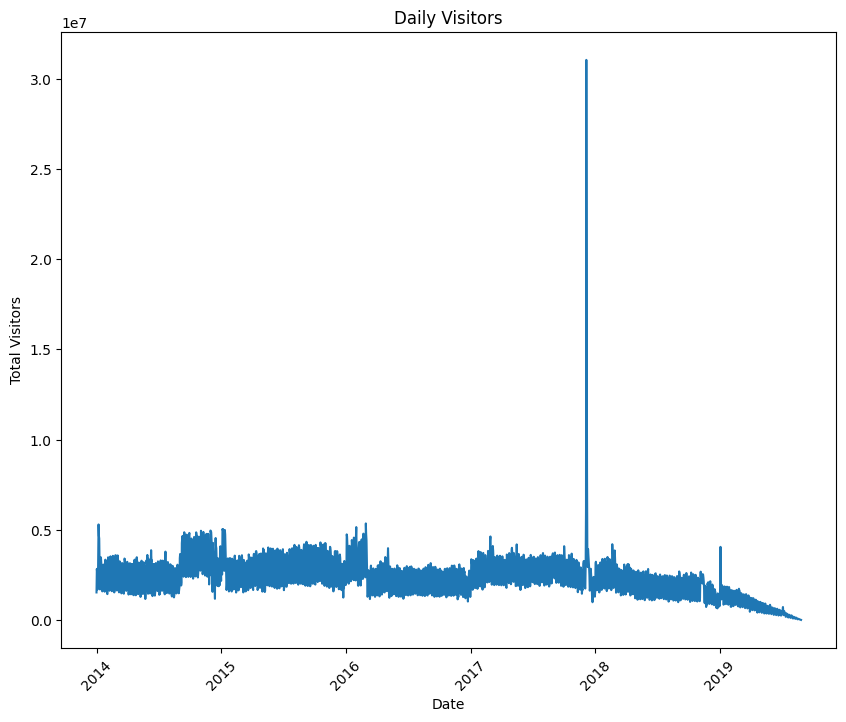

In [0]:
# Daily visitors
result = spark.sql("""
    SELECT TO_DATE(timestamp) AS date, SUM(`# of Visitors`) AS `sum(# of Visitors)` 
    FROM la_tr
    GROUP BY 1
    ORDER BY 1
""").toPandas()

plt.figure(figsize=(10, 8))
sns.lineplot(data=result, x='date', y='sum(# of Visitors)')
plt.xlabel('Date')
plt.ylabel('Total Visitors')
plt.title('Daily Visitors')
plt.xticks(rotation=45)
plt.show()

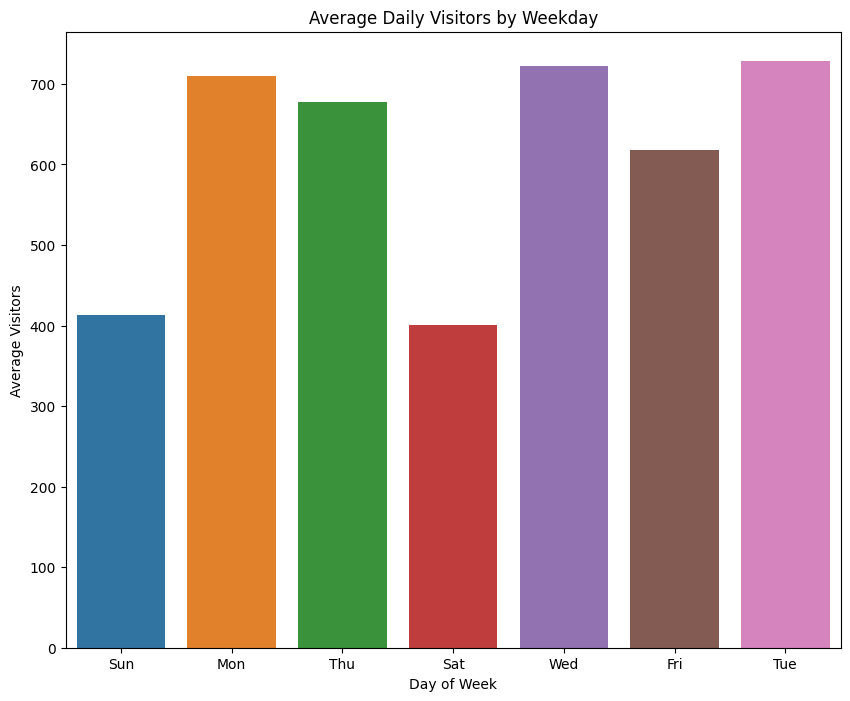

In [0]:
 # Visitors by weekday
result = spark.sql("""
    SELECT date_format(to_date(timestamp), 'E') AS dayofweek, AVG(`# of Visitors`) AS `avg(# of Visitors)` 
    FROM la_tr
    GROUP BY 1
""").toPandas()

plt.figure(figsize=(10, 8))
sns.barplot(data=result, x='dayofweek', y='avg(# of Visitors)')
plt.xlabel('Day of Week')
plt.ylabel('Average Visitors')
plt.title('Average Daily Visitors by Weekday')
plt.xticks(rotation=0)
plt.show()

In [0]:
# bounce_rate_distribution = spark.sql("""
#     SELECT `Bounce Rate`
#     FROM la_tr
# """)

# plt.figure(figsize=(10, 8))
# sns.histplot(data=bounce_rate_distribution.toPandas(), x='Bounce Rate', bins=20, kde=True)
# plt.xlabel('Bounce Rate')
# plt.ylabel('Frequency')
# plt.title('Bounce Rate Distribution')
# plt.show()